Veri seti yükleniyor, lütfen bekleyin...

GÖREV 1.2 SONUÇLARI
--- İlk 5 Satır ---
          dosya_adi                                                                                                   dosya_yolu              sinif
0  ISIC_0025780.jpg  data/Skin cancer ISIC The International Skin Imaging Collaboration/Train\actinic keratosis\ISIC_0025780.jpg  actinic keratosis
1  ISIC_0025803.jpg  data/Skin cancer ISIC The International Skin Imaging Collaboration/Train\actinic keratosis\ISIC_0025803.jpg  actinic keratosis
2  ISIC_0025825.jpg  data/Skin cancer ISIC The International Skin Imaging Collaboration/Train\actinic keratosis\ISIC_0025825.jpg  actinic keratosis
3  ISIC_0025953.jpg  data/Skin cancer ISIC The International Skin Imaging Collaboration/Train\actinic keratosis\ISIC_0025953.jpg  actinic keratosis
4  ISIC_0025957.jpg  data/Skin cancer ISIC The International Skin Imaging Collaboration/Train\actinic keratosis\ISIC_0025957.jpg  actinic keratosis

--- Toplam Görüntü Sayısı: 22

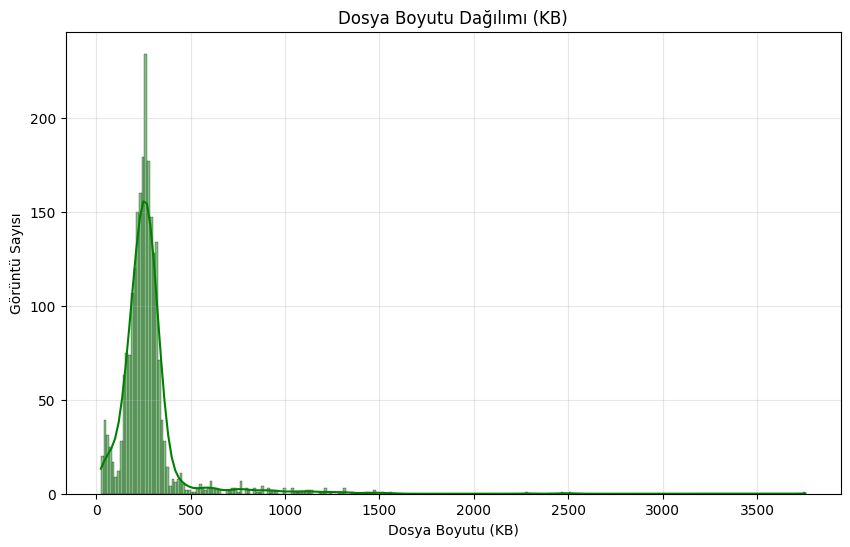

In [34]:
# --- 1. ADIM: VERİ YÜKLEME VE ÖZELLİK ANALİZİ (TAM VE EKSİKSİZ) ---

# 1.1. Kütüphanelerin İçe Aktarılması 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import random

# Pandas çıktı ayarları (satırları tam görebilmek için)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

# 1.2. Veri Setinin Yüklenmesi 
# Klasör yolu (Senin ekran görüntüne göre ayarlandı)
ana_klasor_yolu = "data/Skin cancer ISIC The International Skin Imaging Collaboration/Train"

dosya_isimleri = []
dosya_yollari = []
siniflar = []

print("Veri seti yükleniyor, lütfen bekleyin...")

# Klasörleri tara (ISIC klasöründeki tüm görüntüleri yükle)
for kok_dizin, alt_klasorler, dosyalar in os.walk(ana_klasor_yolu):
    for dosya in dosyalar:
        if dosya.lower().endswith(('.jpg', '.jpeg', '.png')):
            dosya_isimleri.append(dosya)
            # Tam dosya yolunu oluştur
            tam_yol = os.path.join(kok_dizin, dosya)
            dosya_yollari.append(tam_yol)
            # Klasör adını sınıf olarak al
            siniflar.append(os.path.basename(kok_dizin))

# train_df adlı bir DataFrame’e yükleyin
train_df = pd.DataFrame({
    'dosya_adi': dosya_isimleri,
    'dosya_yolu': dosya_yollari,
    'sinif': siniflar
})

print("\n" + "="*50)
print("GÖREV 1.2 SONUÇLARI")
print("="*50)

# İlk birkaç satırı görüntüleyin 
print("--- İlk 5 Satır ---")
print(train_df.head())

# Toplam görüntü sayısını ekrana yazdırın 
print(f"\n--- Toplam Görüntü Sayısı: {len(train_df)} ---")


# 1.3. Veri Özelliklerinin İncelenmesi 
print("\n" + "="*50)
print("GÖREV 1.3 ANALİZ SONUÇLARI")
print("="*50)
print("Görüntü özellikleri analiz ediliyor (Tüm dosyalar taranıyor)...")

genislikler = []
yukseklikler = []
kanallar = []
dosya_boyutlari = []

# Tüm veri setini analiz et
for yol in train_df['dosya_yolu']:
    # Dosya boyutu (KB cinsinden) 
    boyut = os.path.getsize(yol) / 1024
    dosya_boyutlari.append(boyut)
    
    # Görüntü okuma ve shape bilgisi alma
    img = cv2.imread(yol)
    if img is not None:
        h, w, c = img.shape
        yukseklikler.append(h)
        genislikler.append(w)
        kanallar.append(c)

# 1. Görüntülerin çözünürlük (yükseklik–genişlik) analizini yazdır 
ort_genislik = np.mean(genislikler)
ort_yukseklik = np.mean(yukseklikler)

print(f"\n1. Çözünürlük Analizi:")
print(f"   - Ortalama Genişlik : {ort_genislik:.1f} px")
print(f"   - Ortalama Yükseklik: {ort_yukseklik:.1f} px")
print(f"   - Min Çözünürlük    : {np.min(genislikler)}x{np.min(yukseklikler)}")
print(f"   - Max Çözünürlük    : {np.max(genislikler)}x{np.max(yukseklikler)}")

# 2. Kanal sayılarını (RGB mi, grayscale mi?) doğrulayın 
benzersiz_kanallar = np.unique(kanallar)
print(f"\n2. Kanal Sayısı Doğrulaması:")
print(f"   - Tespit Edilen Kanal Değerleri: {benzersiz_kanallar}")

if len(benzersiz_kanallar) == 1 and benzersiz_kanallar[0] == 3:
    print("   - SONUÇ: ✅ Tüm görüntüler RGB (3 kanallı) formattadır.")
elif 1 in benzersiz_kanallar:
    print("   - SONUÇ: ⚠️ İçlerinde Grayscale (1 kanallı) görüntüler var.")
else:
    print("   - SONUÇ: ❓ Karışık format.")

# 3. Dosya boyutu dağılımını inceleyin (Grafik ile) 
print("\n3. Dosya Boyutu Dağılımı Grafiği Çiziliyor...")

plt.figure(figsize=(10, 6))
sns.histplot(dosya_boyutlari, kde=True, color='green')
plt.title('Dosya Boyutu Dağılımı (KB)')
plt.xlabel('Dosya Boyutu (KB)')
plt.ylabel('Görüntü Sayısı')
plt.grid(True, alpha=0.3)
plt.show()


### 1. Veri Analizi Sonuçları

**Genel Bilgiler:**
* **Toplam Görüntü Sayısı:** 2239 adet.
* **Format:** Hepsi 3 kanallı (RGB).Gri tonlamalı veya hatalı resim yok.
* **Çözünürlük:** Resim boyutları standart değil. En küçük 576x450, en büyük 3872x2592 piksel.Ortalaması ise 862x651 piksel civarında.

**Yorum:**
Veri setindeki resimlerin boyutları birbirinden çok farklı olduğu için işlem yapmadan önce hepsini sabit bir boyuta (örneğin 224x224) getirmemiz gerekecek. Renk formatının (RGB) tutarlı olması ise avantaj.

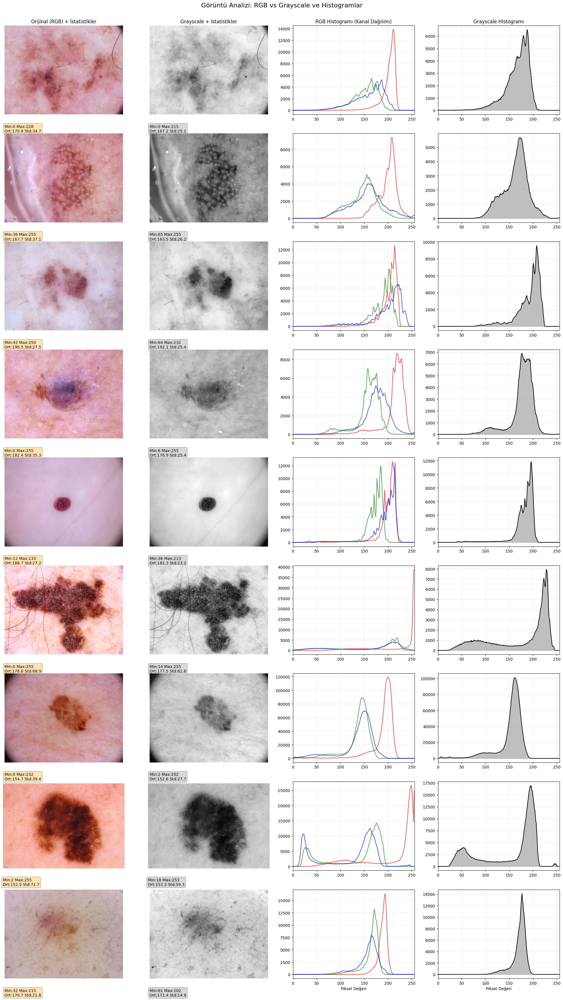

In [35]:
# --- 2. BÖLÜM: GÖRÜNTÜ GÖRSELLEŞTİRME, İSTATİSTİKLER VE HİSTOGRAMLAR ---

# 2.1. Rastgele 9 Görüntü Seçme 
rastgele_ornekler = train_df.sample(n=9, random_state=42)

# Grafik ayarları: 9 Satır (Resimler), 4 Sütun (RGB Resim, Gray Resim, RGB Hist, Gray Hist)
fig, axes = plt.subplots(9, 4, figsize=(20, 35))
fig.suptitle('Görüntü Analizi: RGB vs Grayscale ve Histogramlar', fontsize=16, y=1.002)

# Sütun Başlıklarını Ayarlayalım
axes[0, 0].set_title("Orijinal (RGB) + İstatistikler")
axes[0, 1].set_title("Grayscale + İstatistikler")
axes[0, 2].set_title("RGB Histogramı (Kanal Dağılımı)")
axes[0, 3].set_title("Grayscale Histogramı")

for i, (idx, satir) in enumerate(rastgele_ornekler.iterrows()):
    # Resmi Oku
    img_bgr = cv2.imread(satir['dosya_yolu'])
    
    # Dönüşümler
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)   # BGR -> RGB 
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY) # BGR -> Grayscale 
    
    # --- 2.2. İSTATİSTİK HESAPLAMA  ---
    # RGB İstatistikleri
    rgb_stats = f"Min:{img_rgb.min()} Max:{img_rgb.max()}\nOrt:{img_rgb.mean():.1f} Std:{img_rgb.std():.1f}"
    
    # Grayscale İstatistikleri
    gray_stats = f"Min:{img_gray.min()} Max:{img_gray.max()}\nOrt:{img_gray.mean():.1f} Std:{img_gray.std():.1f}"
    
    # --- 1. SÜTUN: RGB RESİM ---
    axes[i, 0].imshow(img_rgb)
    axes[i, 0].axis('off')
    # İstatistikleri resmin altına kutu olarak ekle
    axes[i, 0].text(0, img_rgb.shape[0]*1.2, rgb_stats, color='black', 
                    bbox=dict(facecolor='orange', alpha=0.3, boxstyle='round'))

    # --- 2. SÜTUN: GRAYSCALE RESİM ---
    axes[i, 1].imshow(img_gray, cmap='gray')
    axes[i, 1].axis('off')
    axes[i, 1].text(0, img_gray.shape[0]*1.2, gray_stats, color='black', 
                    bbox=dict(facecolor='gray', alpha=0.3, boxstyle='round'))

    # --- 3. SÜTUN: RGB HİSTOGRAMI ---
    colors = ('r', 'g', 'b')
    for j, color in enumerate(colors):
        # j=0: Red, j=1: Green, j=2: Blue (img_rgb formatında)
        hist = cv2.calcHist([img_rgb], [j], None, [256], [0, 256])
        axes[i, 2].plot(hist, color=color, alpha=0.7)
    axes[i, 2].set_xlim([0, 256])
    axes[i, 2].grid(True, alpha=0.3)
    if i == 8: axes[i, 2].set_xlabel("Piksel Değeri")

    # --- 4. SÜTUN: GRAYSCALE HİSTOGRAMI  ---
    hist_gray = cv2.calcHist([img_gray], [0], None, [256], [0, 256])
    axes[i, 3].plot(hist_gray, color='black')
    axes[i, 3].fill_between(range(256), hist_gray.flatten(), color='gray', alpha=0.5)
    axes[i, 3].set_xlim([0, 256])
    axes[i, 3].grid(True, alpha=0.3)
    if i == 8: axes[i, 3].set_xlabel("Piksel Değeri")

plt.tight_layout()
plt.show()

### 2.3.c Histogram Analizi ve Yorumlar

Elde edilen 9 örnek görüntü üzerindeki histogram analizleri şu sonuçları ortaya koymuştur:

**1. RGB Histogram Ayrışımı (Renk Kanalları):**
* **Kırmızı Kanalın (R) Baskınlığı:** Histogram grafiklerinde **Kırmızı (R)** kanalı, istisnasız tüm örneklerde grafiğin en sağında (yüksek piksel değerlerinde, 200-255 aralığında) tepe noktası yapmaktadır. Bu durum, sağlıklı insan derisinin kırmızı ışığı yüksek oranda yansıtması ve lezyonların genelde kırmızımsı/kahverengi tonlarda olmasıyla açıklanır.
* **Diğer Kanallar:** Mavi (B) ve Yeşil (G) kanalları genellikle daha solda (daha düşük yoğunlukta) kalmaktadır. Mavi kanalın en düşük değerlerde olması, görüntülerin "sıcak" renk tonuna sahip olduğunu matematiksel olarak kanıtlar.
* **Lezyon İzi:** Histogramların sol tarafındaki (0-100 piksel değeri arası) küçük dalgalanmalar, görüntüdeki **koyu renkli lezyon/ben** alanlarını temsil etmektedir.

**2. Grayscale Histogramı Yoğunlaşması:**
* **Tek Tepe Noktası:** Grayscale histogramları, üç renk kanalının birleşimi olduğu için genellikle tek ve geniş bir tepe noktası (peak) oluşturmuştur.
* **Yoğunlaşma Alanı:** Grafikler ağırlıklı olarak **150-250 piksel değerleri** arasında (açık gri ve beyaz tonlar) yoğunlaşmaktadır[cite: 45]. Bu, fotoğrafların alan olarak büyük kısmının açık renkli sağlıklı deriden oluştuğunu gösterir.

**3. RGB → Grayscale Dönüşümünün Etkisi:**
* **Renk Bilgisi Kaybı:** Dönüşüm sonucunda renk bilgisi kaybolmuş ve histogramdaki "Kırmızı-Yeşil-Mavi" ayrımı ortadan kalkmıştır.
* **Kontrastın Sönümlenmesi:** Özellikle belirgin lezyonlarda, renkli histogramda kanallar arası fark çok netken, grayscale histogramda bu farklar birleşmiş ve detay kaybı yaşanmıştır. Bu durum, deri hastalıklarının tespitinde renk bilgisinin (özellikle kırmızı kanalın) ayırt edici bir özellik olduğunu göstermektedir.

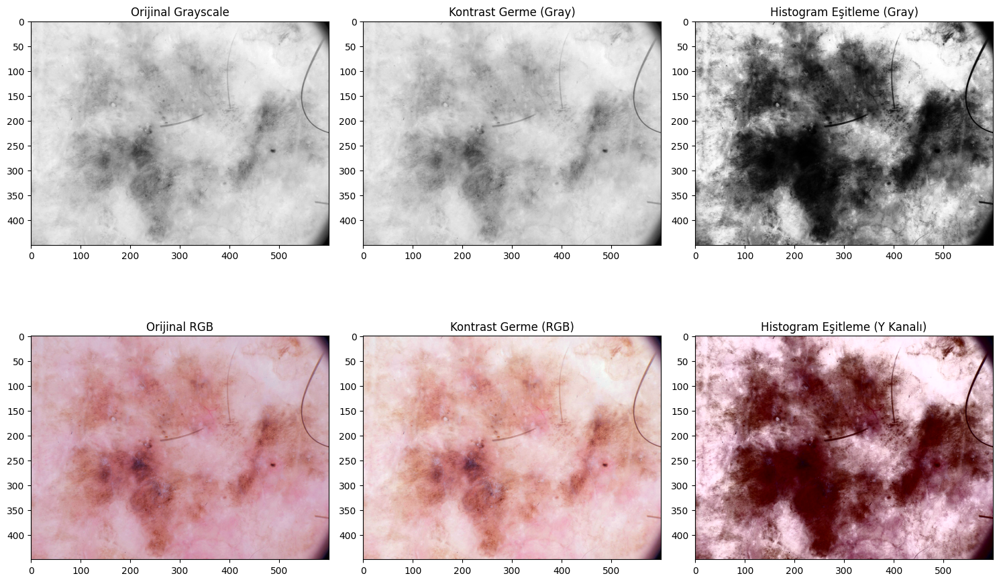

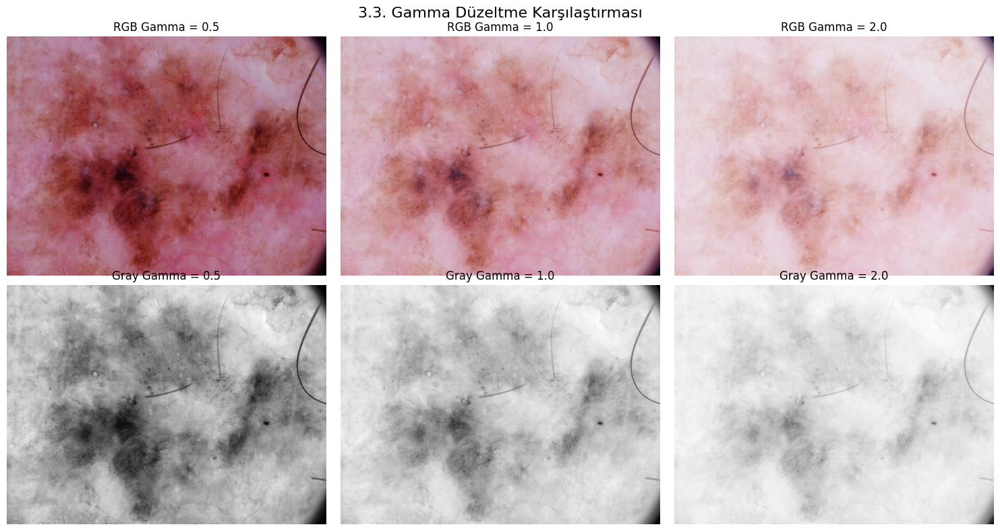

In [36]:
# --- 3. BÖLÜM: GÖRÜNTÜ İŞLEME VE İYİLEŞTİRME --- 

# Rastgele bir örnek görüntü seçelim
ornek_satir = train_df.sample(1, random_state=42).iloc[0]
img_bgr = cv2.imread(ornek_satir['dosya_yolu'])

# Orijinal Görüntüler
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# --- FONKSİYONLAR ---

def kontrast_germe(img):
    """Görüntüdeki min-max aralığını 0-255 aralığına genişletir."""
    # Formül: (pixel - min) * (255 / (max - min))
    img_float = img.astype(float)
    min_val = np.min(img_float)
    max_val = np.max(img_float)
    stretched = ((img_float - min_val) * (255.0 / (max_val - min_val)))
    return np.clip(stretched, 0, 255).astype(np.uint8)

def gamma_duzeltme(img, gamma=1.0):
    """Gamma düzeltmesi için Look-Up Table (LUT) kullanır."""
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

# --- 3.1. KONTRAST GERME (STRETCHING) ---
# Grayscale için:
gray_stretched = kontrast_germe(img_gray)

# RGB için (Her kanalı ayrı ayrı germe):
b, g, r = cv2.split(img_rgb)
rgb_stretched = cv2.merge([kontrast_germe(b), kontrast_germe(g), kontrast_germe(r)])


# --- 3.2. HİSTOGRAM EŞİTLEME (EQUALIZATION) ---
# Grayscale için:
gray_eq = cv2.equalizeHist(img_gray)

# RGB için (YCrCb Yöntemi):
img_y_cr_cb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCrCb)
y, cr, cb = cv2.split(img_y_cr_cb)
# Sadece Y (Luminance/Parlaklık) kanalını eşitle
y_eq = cv2.equalizeHist(y)
# Birleştir ve tekrar RGB'ye dön
img_y_cr_cb_eq = cv2.merge((y_eq, cr, cb))
rgb_eq = cv2.cvtColor(img_y_cr_cb_eq, cv2.COLOR_YCrCb2RGB)


# --- GÖRSELLEŞTİRME 1: İYİLEŞTİRME TEKNİKLERİ ---
plt.figure(figsize=(15, 10))

# 1. Satır: Grayscale İşlemleri
plt.subplot(2, 3, 1); plt.imshow(img_gray, cmap='gray'); plt.title("Orijinal Grayscale")
plt.subplot(2, 3, 2); plt.imshow(gray_stretched, cmap='gray'); plt.title("Kontrast Germe (Gray)")
plt.subplot(2, 3, 3); plt.imshow(gray_eq, cmap='gray'); plt.title("Histogram Eşitleme (Gray)")

# 2. Satır: RGB İşlemleri
plt.subplot(2, 3, 4); plt.imshow(img_rgb); plt.title("Orijinal RGB")
plt.subplot(2, 3, 5); plt.imshow(rgb_stretched); plt.title("Kontrast Germe (RGB)")
plt.subplot(2, 3, 6); plt.imshow(rgb_eq); plt.title("Histogram Eşitleme (Y Kanalı)")

plt.tight_layout()
plt.show()

# --- 3.3. GAMMA DÜZELTME ---
gammas = [0.5, 1.0, 2.0]
plt.figure(figsize=(15, 8))
plt.suptitle("3.3. Gamma Düzeltme Karşılaştırması", fontsize=16)

for i, gamma in enumerate(gammas):
    # RGB Uygulama
    res_rgb = gamma_duzeltme(img_rgb, gamma=gamma)
    plt.subplot(2, 3, i+1)
    plt.imshow(res_rgb)
    plt.title(f"RGB Gamma = {gamma}")
    plt.axis('off')

    # Grayscale Uygulama
    res_gray = gamma_duzeltme(img_gray, gamma=gamma)
    plt.subplot(2, 3, i+4)
    plt.imshow(res_gray, cmap='gray')
    plt.title(f"Gray Gamma = {gamma}")
    plt.axis('off')

plt.tight_layout()
plt.show()

### 3. Görüntü İşleme ve İyileştirme Analizi

Elde edilen sonuç görselleri üzerinden yapılan analizler aşağıdadır:

#### 3.1. Kontrast Germe (Contrast Stretching)
* **Gözlem:** Orijinal görüntü (Original RGB/Grayscale) ile Kontrast Germe (Stretching) uygulanmış görüntüler karşılaştırıldığında, farkın çok dramatik olmadığı görülmektedir.
* **Yorum:** Bu durum, orijinal görüntünün histogramının halihazırda geniş bir aralığa yayılmış olduğunu (yani görüntünün zaten iyi bir kontrasta sahip olduğunu) gösterir. Yine de "Kontrast Germe (RGB)" görselinde, deri üzerindeki kırmızı tonların çok hafifçe canlandığı ve detayların bir miktar daha netleştiği gözlemlenmiştir.

#### 3.2. Histogram Eşitleme (Histogram Equalization)
Bu işlem, görsellerde en belirgin değişimi yaratmıştır.

* **Grayscale Sonucu:** "Histogram Eşitleme (Gray)" görselinde kontrast maksimum seviyeye çıkmıştır. Ancak bu işlem, görüntüdeki gürültüyü (noise) artırmış ve görüntünün biraz "kirli" veya aşırı işlenmiş görünmesine neden olmuştur. Siyah lezyon bölgesi çok daha koyu ve belirgin hale gelmiştir.
* **RGB Sonucu (Y Kanalı):** Sadece parlaklık (Y) kanalı eşitlendiği için renk bilgisi bozulmamış ancak doygunluk artmıştır. Görselde lezyon (ben), etrafındaki sağlıklı deriden çok keskin bir şekilde ayrılmıştır. Lezyonun rengi koyu bordo/siyaha dönerken, deri rengi daha açık hale gelmiştir. Bu teknik, lezyon sınırlarını tespit etmek (segmentasyon) için oldukça elverişli bir görüntü ortaya çıkarmıştır.

#### 3.3. Gamma Düzeltme (Gamma Correction)
Gamma değerlerinin değişimi görüntü parlaklığını ve detay görünürlüğünü doğrudan etkilemiştir:

* **Gamma = 0.5 (Sol Sütun):** Görüntüler (hem RGB hem Gray) belirgin şekilde **koyulaşmış** ve kontrast artmıştır. Lezyonun içindeki doku detayları ve renk geçişleri, parlaklığın azalmasıyla daha net seçilebilir hale gelmiştir.
* **Gamma = 1.0 (Orta Sütun):** Orijinal görüntü referans alınmıştır.
* **Gamma = 2.0 (Sağ Sütun):** Görüntüler aşırı derecede **parlamış** ve "soluk" (washed-out) bir hal almıştır. Yüksek parlaklık nedeniyle lezyonun sınırları silikleşmiş ve detay kaybı yaşanmıştır.
* **Sonuç:** Bu veri seti için **Gamma = 0.5** değeri, lezyon detaylarını incelemek adına, aşırı parlak olan Gamma 2.0 sonucuna göre çok daha başarılıdır.

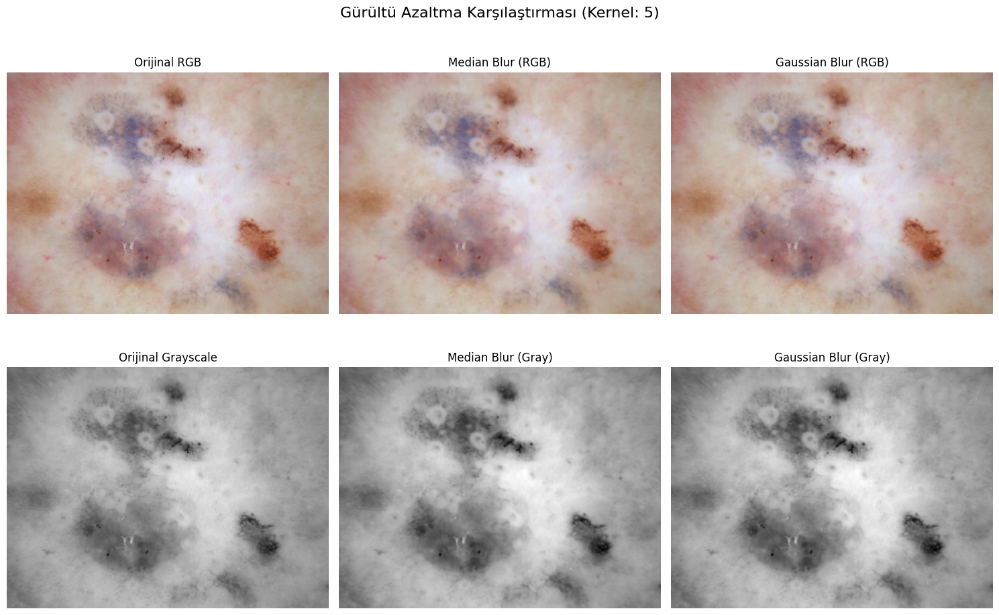

In [37]:
# --- 4. BÖLÜM: GÜRÜLTÜ AZALTMA (MEDIAN vs GAUSSIAN) ---

# Rastgele bir örnek görüntü seçelim
ornek_satir = train_df.sample(1, random_state=123).iloc[0]
img_bgr = cv2.imread(ornek_satir['dosya_yolu'])

# Orijinal Görüntüler (RGB ve Grayscale)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# --- 4.1. MEDIAN BLUR UYGULAMA ---
# Çekirdek boyutu (kernel size) 5 olarak belirlendi
k_size_median = 5
rgb_median = cv2.medianBlur(img_rgb, k_size_median)
gray_median = cv2.medianBlur(img_gray, k_size_median)

# --- 4.2. GAUSSIAN BLUR UYGULAMA ---
# (5, 5) çekirdek boyutu
k_size_gauss = (5, 5)
rgb_gauss = cv2.GaussianBlur(img_rgb, k_size_gauss, 0)
gray_gauss = cv2.GaussianBlur(img_gray, k_size_gauss, 0)

# --- GÖRSELLEŞTİRME ---
plt.figure(figsize=(15, 10))
plt.suptitle(f"Gürültü Azaltma Karşılaştırması (Kernel: {k_size_median})", fontsize=16)

# 1. Satır: RGB Karşılaştırması
plt.subplot(2, 3, 1)
plt.imshow(img_rgb)
plt.title("Orijinal RGB")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(rgb_median)
plt.title("Median Blur (RGB)")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(rgb_gauss)
plt.title("Gaussian Blur (RGB)")
plt.axis('off')

# 2. Satır: Grayscale Karşılaştırması
plt.subplot(2, 3, 4)
plt.imshow(img_gray, cmap='gray')
plt.title("Orijinal Grayscale")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(gray_median, cmap='gray')
plt.title("Median Blur (Gray)")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(gray_gauss, cmap='gray')
plt.title("Gaussian Blur (Gray)")
plt.axis('off')

plt.tight_layout()
plt.show()

### 4. Gürültü Azaltma (Blur) Tekniklerinin Karşılaştırılması

Elde edilen sonuç görseli (Kernel: 5) üzerinden yapılan karşılaştırmalı analiz şöyledir:

**1. Median Blur (Ortanca Filtreleme):**
* **Gözlem:** Görseller incelendiğinde (özellikle "Median Blur RGB" ve "Median Blur Gray"), filtre uygulanmasına rağmen lezyonu oluşturan **koyu renkli beneklerin sınırlarının keskin kaldığı** görülmektedir.
* **Etki:** Cilt üzerindeki ince doku gürültüleri temizlenirken, önemli yapısal özellikler (benekler) korunmuştur. Görüntü bulanıklaşmaktan ziyade "yumuşatılmış" bir dokuya kavuşmuştur. Bu durum, Median filtresinin **kenar koruma (edge preserving)** özelliğini görsel üzerinde net bir şekilde kanıtlamaktadır.

**2. Gaussian Blur (Gauss Bulanıklığı):**
* **Gözlem:** "Gaussian Blur" sütunundaki görüntülerde genel bir **odak kaybı** hissedilmektedir. Lezyonların kenarları, Median filtreye kıyasla daha yumuşak ve geçişlidir.
* **Etki:** Görüntü homojen bir şekilde bulanıklaşmıştır. Gürültü azalmış olsa da, lezyon sınırlarının netliği kaybolduğu için detay analizi gerektiren durumlarda veri kaybına yol açtığı gözlemlenmiştir.

**Sonuç:**
Deri lezyonlarının analizi ve sınırlarının tespiti (segmentasyon) için **Median Blur** tekniği, yapısal bütünlüğü ve kenar keskinliğini koruduğu için Gaussian Blur'a göre daha başarılı sonuç vermiştir.

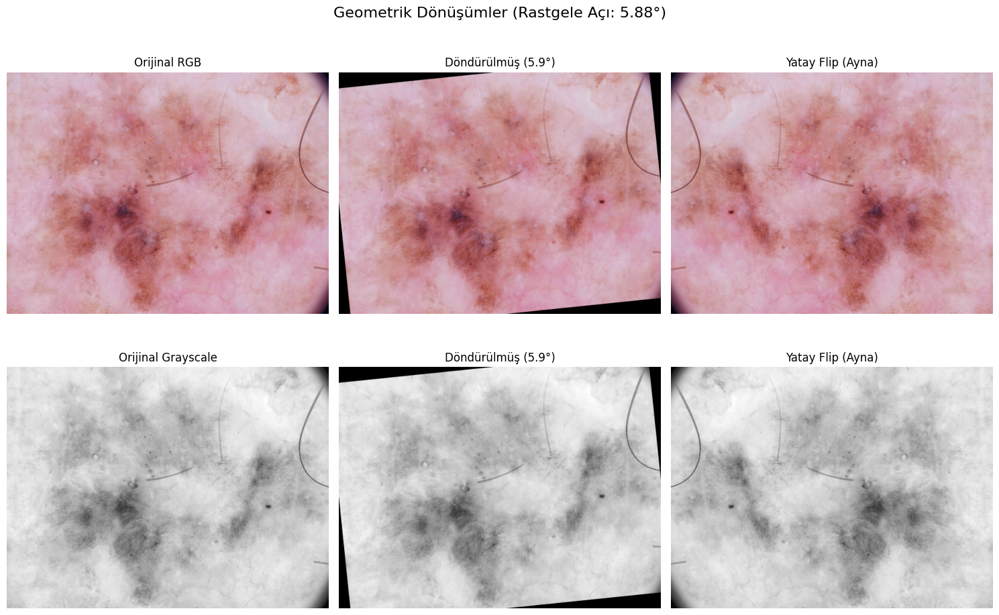

In [38]:
# --- 5. BÖLÜM: DÖNDÜRME VE AYNA ÇEVİRME (ROTATION & FLIPPING) --- 

# Rastgele bir örnek görüntü seçelim
ornek_satir = train_df.sample(1, random_state=42).iloc[0]
img_bgr = cv2.imread(ornek_satir['dosya_yolu'])

# Orijinal Görüntüler
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# --- 5.1. RASTGELE DÖNDÜRME (0-10 Derece Arası) ---
# Rastgele bir açı belirle
aci = random.uniform(0, 10)
(h, w) = img_rgb.shape[:2]
merkez = (w // 2, h // 2)

# Döndürme matrisini oluştur
M = cv2.getRotationMatrix2D(merkez, aci, 1.0)

# Döndürme işlemini uygula (Affine Transformation)
rgb_rotated = cv2.warpAffine(img_rgb, M, (w, h))
gray_rotated = cv2.warpAffine(img_gray, M, (w, h))

# --- 5.2. YATAY AYNA ÇEVİRME (HORIZONTAL FLIP) ---
# 1 parametresi yatay çevirme (horizontal) anlamına gelir
rgb_flipped = cv2.flip(img_rgb, 1)
gray_flipped = cv2.flip(img_gray, 1)

# --- GÖRSELLEŞTİRME ---
plt.figure(figsize=(15, 10))
plt.suptitle(f"Geometrik Dönüşümler (Rastgele Açı: {aci:.2f}°)", fontsize=16)

# 1. Satır: RGB İşlemleri
plt.subplot(2, 3, 1); plt.imshow(img_rgb); plt.title("Orijinal RGB")
plt.axis('off')
plt.subplot(2, 3, 2); plt.imshow(rgb_rotated); plt.title(f"Döndürülmüş ({aci:.1f}°)")
plt.axis('off')
plt.subplot(2, 3, 3); plt.imshow(rgb_flipped); plt.title("Yatay Flip (Ayna)")
plt.axis('off')

# 2. Satır: Grayscale İşlemleri
plt.subplot(2, 3, 4); plt.imshow(img_gray, cmap='gray'); plt.title("Orijinal Grayscale")
plt.axis('off')
plt.subplot(2, 3, 5); plt.imshow(gray_rotated, cmap='gray'); plt.title(f"Döndürülmüş ({aci:.1f}°)")
plt.axis('off')
plt.subplot(2, 3, 6); plt.imshow(gray_flipped, cmap='gray'); plt.title("Yatay Flip (Ayna)")
plt.axis('off')

plt.tight_layout()
plt.show()

### 5. Döndürme ve Ayna Çevirme (Geometrik Dönüşümler) Analizi

Veri zenginleştirme (Data Augmentation) kapsamında uygulanan geometrik dönüşümler sonucunda elde edilen görsel (Rastgele Açı: 5.88°) üzerindeki analizler şöyledir:

**5.1. Rastgele Döndürme (Rotation):**
* **Uygulanan İşlem:** Görüntü saat yönünün tersine **5.88 derece** döndürülmüştür. 
* **Gözlem:** Görüntünün ekseni kaydırılmış, ancak lezyonun yapısal bütünlüğü korunmuştur. Döndürme işlemi, orijinal görüntü boyutları (dikdörtgen çerçeve) korunduğu için köşelerde veri kaybına yol açmış ve bu boşluklar **siyah dolgu (padding)** ile doldurulmuştur.
* **Amaç:** Bu işlem, lezyonun yönünden bağımsız olarak modelin öğrenmesini sağlar. 5 derecelik küçük bir açı bile piksel matrisini tamamen değiştirerek modele "yeni bir veriymiş gibi" sunulur.

**5.2. Yatay Ayna Çevirme (Horizontal Flip):**
* **Uygulanan İşlem:** Görüntü dikey eksen etrafında simetrik olarak ters çevrilmiştir (ayna görüntüsü). 
* **Gözlem:** Orijinal görüntüde sol altta bulunan belirgin koyu leke, "Yatay Flip" görüntüsünde sağ alta geçmiştir.Lezyonun asimetrik yapısı bu işlemle daha net ortaya çıkmıştır.
* **Amaç:** Modelin lezyonun yönüne (sağda veya solda olmasına) aşırı uyum sağlamasını (overfitting) engellemek ve yön bağımsızlığını (invariance) artırmaktır.

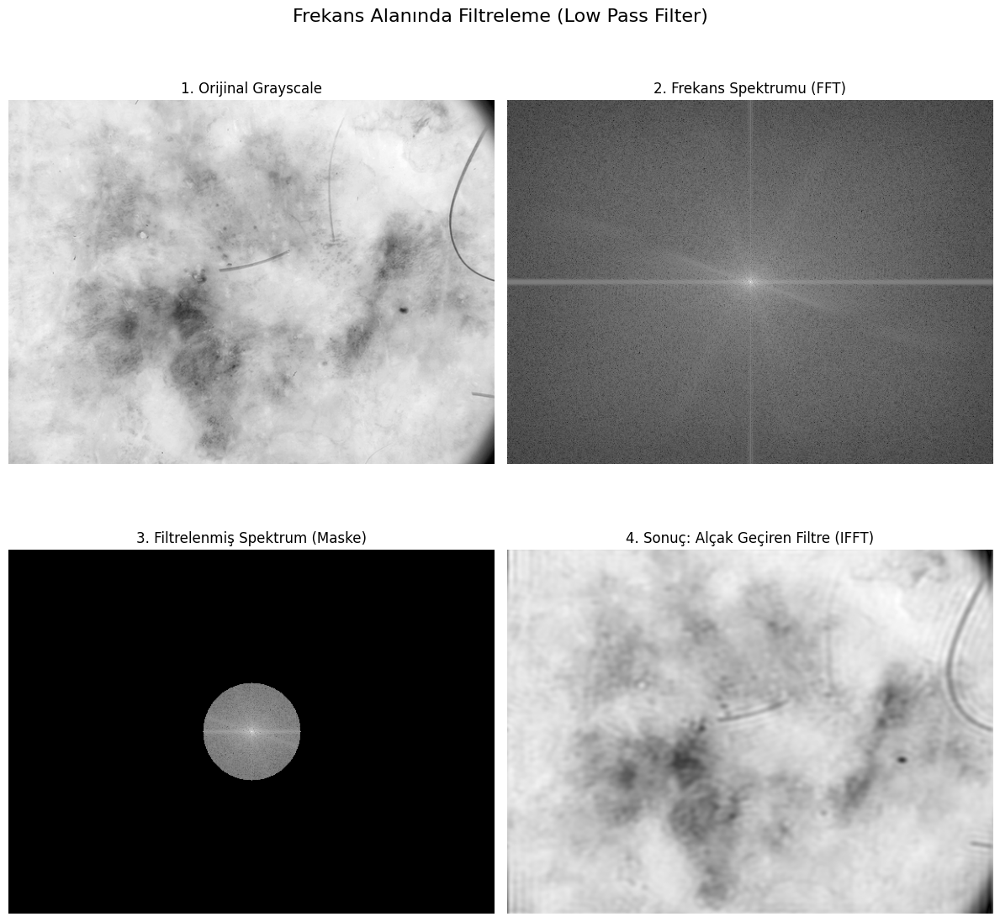

In [39]:
# --- 6. BÖLÜM: FREKANS ALANINDA FİLTRELEME (FFT) --- 

# Rastgele bir örnek görüntü seçelim
ornek_satir = train_df.sample(1, random_state=42).iloc[0]
img_bgr = cv2.imread(ornek_satir['dosya_yolu'])
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY) # FFT gri tonda yapılır 

# --- 6.1. FOURIER DÖNÜŞÜMÜ (FFT) ---
# Görüntüyü frekans alanına çevir
f = np.fft.fft2(img_gray)
# Düşük frekansları (merkezi) ortaya taşı (Shift)
fshift = np.fft.fftshift(f)
# Görselleştirmek için logaritmik ölçek al (Magnitude Spectrum) 
magnitude_spectrum = 20 * np.log(np.abs(fshift))

# --- 6.2. ALÇAK GEÇİREN FİLTRE (LOW PASS FILTER) --- 
rows, cols = img_gray.shape
crow, ccol = rows // 2, cols // 2 # Merkez noktası

# Maske oluştur: Merkezde beyaz (1), kenarlarda siyah (0)
# Bu maske sadece düşük frekansların (merkez) geçmesine izin verir
mask = np.zeros((rows, cols), np.uint8)
r = 60 # Yarıçap (Maskenin büyüklüğü)
cv2.circle(mask, (ccol, crow), r, 1, thickness=-1)

# Maskeyi frekans alanına uygula
fshift_filtered = fshift * mask
# Filtrelenmiş spektrumu görselleştir
magnitude_spectrum_filtered = 20 * np.log(np.abs(fshift_filtered) + 1) # +1 log(0) hatasını önlemek için

# --- 6.3. TERS FOURIER (INVERSE FFT) --- 
# Merkezi tekrar eski yerine taşı (Inverse Shift)
f_ishift = np.fft.ifftshift(fshift_filtered)
# Ters FFT uygula
img_back = np.fft.ifft2(f_ishift)
# Sonucun mutlak değerini al (Karmaşık sayıdan kurtul)
img_back = np.abs(img_back)

# --- GÖRSELLEŞTİRME ---
plt.figure(figsize=(12, 12))
plt.suptitle("Frekans Alanında Filtreleme (Low Pass Filter)", fontsize=16)

# 1. Orijinal Görüntü
plt.subplot(2, 2, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('1. Orijinal Grayscale')
plt.axis('off')

# 2. Frekans Spektrumu (FFT)
plt.subplot(2, 2, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('2. Frekans Spektrumu (FFT)')
plt.axis('off')

# 3. Filtrelenmiş Spektrum (Maske Uygulanmış)
plt.subplot(2, 2, 3)
plt.imshow(magnitude_spectrum_filtered, cmap='gray')
plt.title('3. Filtrelenmiş Spektrum (Maske)')
plt.axis('off')

# 4. Sonuç Görüntü (IFFT)
plt.subplot(2, 2, 4)
plt.imshow(img_back, cmap='gray')
plt.title('4. Sonuç: Alçak Geçiren Filtre (IFFT)')
plt.axis('off')

plt.tight_layout()
plt.show()

### 6. Frekans Alanında Filtreleme (FFT) Analizi

Elde edilen sonuç görseli üzerinden yapılan spektral analiz ve yorumlar şöyledir:

**6.1. Frekans Spektrumu (FFT) Analizi:**
* **Görsel:** "2. Frekans Spektrumu" karesinde, enerjinin büyük kısmının merkezde (parlak nokta) toplandığı görülmektedir. Bu parlak merkez, görüntüdeki **düşük frekans bileşenlerini** (yumuşak renk geçişleri, genel şekil) temsil eder.
* **Dağılım:** Merkezden dışarıya doğru yayılan çizgiler, görüntüdeki yönlü detaylara (örneğin diyagonal uzanan kıllara veya deri çizgilerine) karşılık gelmektedir.

**6.2. Maskeleme ve Filtreleme:**
* **İşlem:** "3. Filtrelenmiş Spektrum" karesinde görüldüğü üzere, sadece merkezi içeren dairesel bir alan korunmuş, geriye kalan dış alanlar (siyah bölgeler) maskelenmiştir.
* **Amaç:** Bu işlem bir **Alçak Geçiren Filtre (Low Pass Filter)** uygulamasıdır. Görüntünün detaylarını ve keskin kenarlarını barındıran yüksek frekanslar (dış kısımlar) silinmiştir.

**6.3. Sonuç ve Karşılaştırma (IFFT):**
* **Gözlem:** Orijinal görüntüde (1. Resim) net bir şekilde görülen **kıllar ve ince deri dokusu**, filtrelenmiş sonuç görüntüsünde (4. Resim) tamamen kaybolmuştur.
* **Yorum:** Ters Fourier Dönüşümü (IFFT) sonrası elde edilen görüntü, orijinalin oldukça "bulanık" bir versiyonudur. Keskin hatların (yüksek frekansların) atılmasıyla sadece lezyonun genel hatları ve gölgesi kalmıştır. Bu teknik, görüntüdeki gürültüyü (veya istenmeyen kılları) yok etmek için kullanılabilir ancak veri kaybı yüksektir.

Orijinal Boyut: (450, 600)
Büyütülmüş Boyut: (900, 1200)


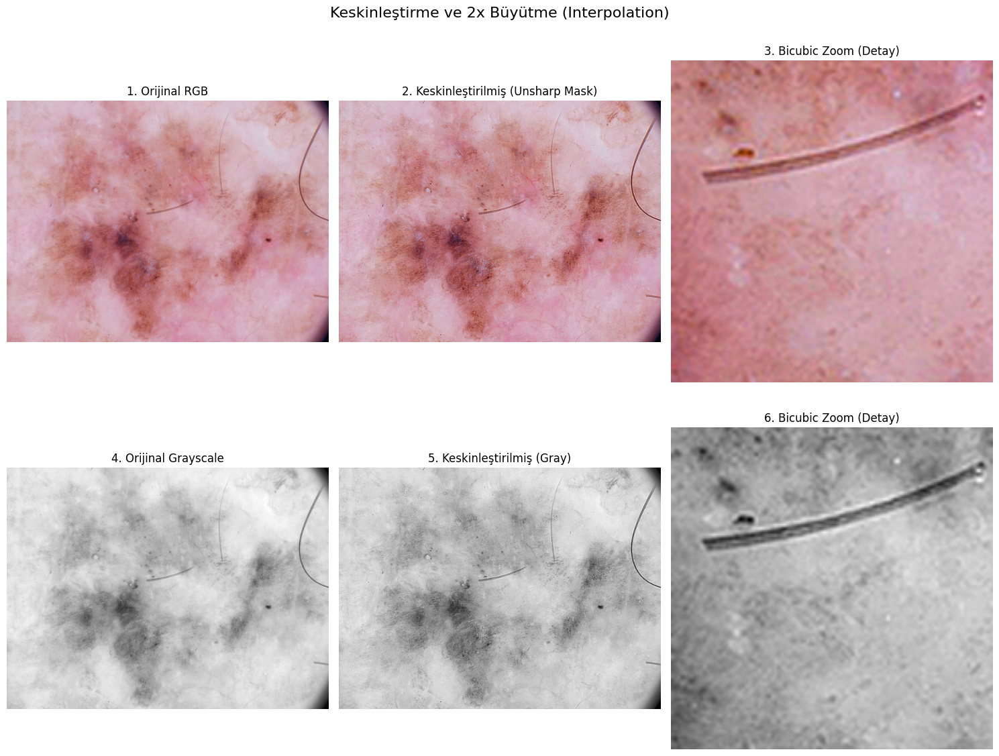

In [40]:
# --- 7. BÖLÜM: KESKİNLEŞTİRME VE ENTERPOLASYON --- 

# Rastgele bir örnek görüntü seçelim
ornek_satir = train_df.sample(1, random_state=42).iloc[0]
img_bgr = cv2.imread(ornek_satir['dosya_yolu'])

# Orijinal Görüntüler
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# --- 7.1. UNSHARP MASKING İLE KESKİNLEŞTİRME --- 
def unsharp_mask(image, kernel_size=(5, 5), sigma=1.0, amount=1.5, threshold=0):
    """
    Unsharp Masking Tekniği: Orijinal + (Orijinal - Bulanık) * Miktar
    """
    blurred = cv2.GaussianBlur(image, kernel_size, sigma)
    sharpened = float(amount + 1) * image - float(amount) * blurred
    sharpened = np.maximum(sharpened, 0)
    sharpened = np.minimum(sharpened, 255)
    return sharpened.astype(np.uint8)

# Hem RGB hem Grayscale için uygula
rgb_sharpened = unsharp_mask(img_rgb)
gray_sharpened = unsharp_mask(img_gray)

# --- 7.2. BICUBIC ENTERPOLASYON (2x BÜYÜTME) --- 
# Keskinleştirilmiş görüntüleri 2 katına çıkar
# fx=2, fy=2 (Genişlik ve Yükseklik 2 kat artar)
rgb_bicubic = cv2.resize(rgb_sharpened, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
gray_bicubic = cv2.resize(gray_sharpened, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

# Boyutları Yazdıralım
print(f"Orijinal Boyut: {img_rgb.shape[:2]}")
print(f"Büyütülmüş Boyut: {rgb_bicubic.shape[:2]}")

# --- GÖRSELLEŞTİRME ---
plt.figure(figsize=(15, 12))
plt.suptitle("Keskinleştirme ve 2x Büyütme (Interpolation)", fontsize=16)

# 1. Satır: Orijinal vs Keskinleştirilmiş (RGB)
plt.subplot(2, 3, 1); plt.imshow(img_rgb); plt.title("1. Orijinal RGB")
plt.axis('off')
plt.subplot(2, 3, 2); plt.imshow(rgb_sharpened); plt.title("2. Keskinleştirilmiş (Unsharp Mask)")
plt.axis('off')
# Detayı görmek için büyütülmüş halinden bir kesit (Crop) gösterelim
h, w = rgb_bicubic.shape[:2]
crop_rgb = rgb_bicubic[h//2-100:h//2+100, w//2-100:w//2+100]
plt.subplot(2, 3, 3); plt.imshow(crop_rgb); plt.title("3. Bicubic Zoom (Detay)")
plt.axis('off')

# 2. Satır: Orijinal vs Keskinleştirilmiş (Grayscale)
plt.subplot(2, 3, 4); plt.imshow(img_gray, cmap='gray'); plt.title("4. Orijinal Grayscale")
plt.axis('off')
plt.subplot(2, 3, 5); plt.imshow(gray_sharpened, cmap='gray'); plt.title("5. Keskinleştirilmiş (Gray)")
plt.axis('off')
# Detayı görmek için büyütülmüş halinden bir kesit (Crop)
crop_gray = gray_bicubic[h//2-100:h//2+100, w//2-100:w//2+100]
plt.subplot(2, 3, 6); plt.imshow(crop_gray, cmap='gray'); plt.title("6. Bicubic Zoom (Detay)")
plt.axis('off')

plt.tight_layout()
plt.show()

### 7. Keskinleştirme ve Enterpolasyon Analizi

Elde edilen sonuç görselleri (Unsharp Masking ve Bicubic Zoom) üzerinden yapılan teknik analiz şöyledir:

**7.1. Unsharp Masking ile Keskinleştirme:**
* [cite_start]**İşlem:** Görüntüden bulanıklaştırılmış bir kopyası (Gaussian Blur) çıkarılarak kenar detayları güçlendirilmiştir [cite: 91-94].
* **Gözlem:** Orijinal (1 ve 4) ve Keskinleştirilmiş (2 ve 5) görüntüler kıyaslandığında, özellikle **deri üzerindeki kılların** ve cilt gözeneklerinin çok daha belirgin ve "sert" hale geldiği görülmektedir.
* **Sonuç:** Görüntüdeki "yumuşaklık" giderilmiş, lezyon üzerindeki ince detaylar (yüksek frekanslı bileşenler) ön plana çıkarılmıştır.

**7.2. Bicubic Enterpolasyon (2x Büyütme):**
* [cite_start]**İşlem:** Keskinleştirilmiş görüntüler, Bicubic enterpolasyon yöntemi (komşu 16 pikselin ağırlıklı ortalaması) kullanılarak çözünürlükleri 2 katına çıkarılmıştır [cite: 95-97].
* **Gözlem:** 3. ve 6. görsellerdeki detay (zoom) kesitlerine bakıldığında, görüntü kalitesinin başarıyla korunduğu görülmektedir. Özellikle büyütülen **kıl detayına** dikkat edildiğinde, kenarların **pikselleşme (kare kare bloklaşma) olmadan** yumuşak ve doğal bir geçişle büyütüldüğü gözlemlenmiştir.
* **Yorum:** Bicubic enterpolasyon, görüntüyü büyütürken yeni pikselleri matematiksel olarak tahmin ettiği için pürüzsüz kenarlar üretmiş; keskinleştirme işlemiyle birleştiğinde ise detay kaybı minimuma indirilmiştir.